244329020-Nurdan Ekmen , ChestX-ray8 dataset veri seti'nden alınan göğüs röntgeni görüntüleri ödevş.

Kütüphaneler yüklenir

In [ ]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import seaborn as sns
sns.set()

In [ ]:
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 26.13 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


csvden okuyarak, ilk 5 veriyi kontrol ediyoruz. satır ve sütun sayısını çekiyoruz.

In [ ]:
# Read csv file containing training datadata
train_df = pd.read_csv("nih/train-small.csv")
# Print first 5 rows
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')
train_df.head()

There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


Kolon veri tiplerini inceliyoruz.

In [ ]:
# Look at the data type of each column and whether null values are present
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

Tekrarlayan Verilerin Kontrolü

In [ ]:
print(f"The total patient ids are {train_df['PatientId'].count()}, from those the unique ids are {train_df['PatientId'].value_counts().shape[0]} ")

The total patient ids are 1000, from those the unique ids are 928 


train_df veri setindeki tüm sütun adlarını listeliyoruz.

In [ ]:
columns = train_df.keys()
columns = list(columns)
print(columns)

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


Gereksiz kolonları çıkarma işlemi

In [ ]:
# Remove unnecesary elements
columns.remove('Image')
columns.remove('PatientId')
# Get the total classes
print(f"There are {len(columns)} columns of labels for these conditions: {columns}")

There are 14 columns of labels for these conditions: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


Her bir sütundaki (etiket sınıfındaki) pozitif örneklerin sayısını hesaplayıp ekrana yazdırma işlemi

In [ ]:
# Print out the number of positive labels for each class
for column in columns:
    print(f"The class {column} has {train_df[column].sum()} samples")

The class Atelectasis has 106 samples
The class Cardiomegaly has 20 samples
The class Consolidation has 33 samples
The class Edema has 16 samples
The class Effusion has 128 samples
The class Emphysema has 13 samples
The class Fibrosis has 14 samples
The class Hernia has 2 samples
The class Infiltration has 175 samples
The class Mass has 45 samples
The class Nodule has 54 samples
The class Pleural_Thickening has 21 samples
The class Pneumonia has 10 samples
The class Pneumothorax has 38 samples


Data Visualization

Rastgele 9 görüntü seçiyoruz.3x3  gri tonlamalı olarak görüntüyoruz.

Display Random Images


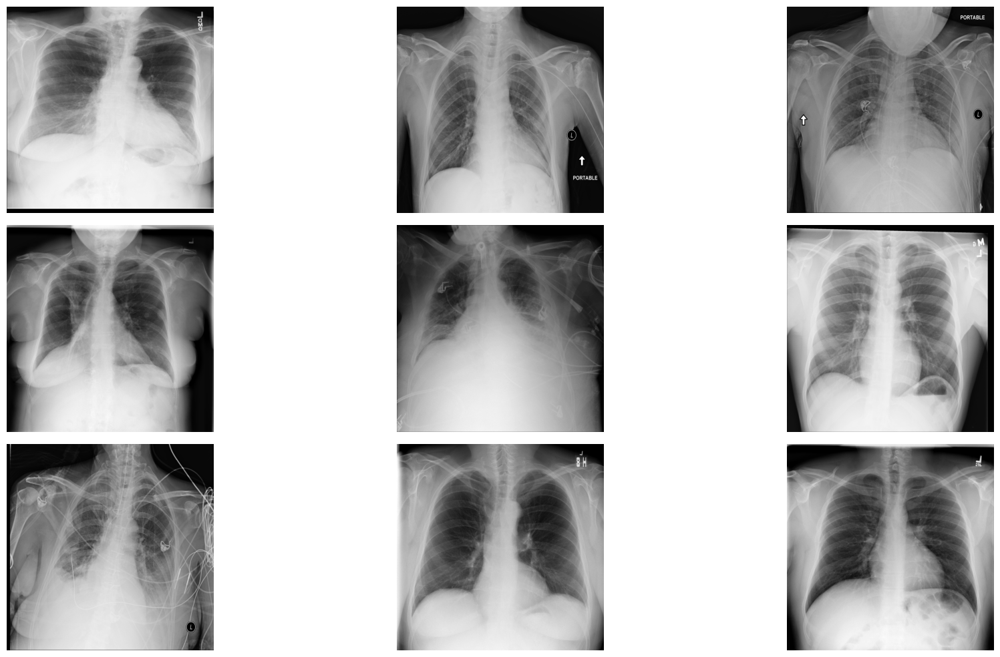

In [ ]:
# Extract numpy values from Image column in data frame
images = train_df['Image'].values

# Extract 9 random images from it
random_images = [np.random.choice(images) for i in range(9)]

# Location of the image dir
img_dir = 'nih/images_small/'

print('Display Random Images')

# Adjust the size of your images
plt.figure(figsize=(20,10))

# Iterate and plot random images
for i in range(9):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()

Seçilen görüntülerin istatistiklerini yazdırıyoruz. (MAKSIMUM, MINIMUM, MEAN VE STD)

Image 1 - 00011420_023.png:
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 0.9725 and the minimum is 0.0000
The mean value of the pixels is 0.6380 and the standard deviation is 0.2550
--------------------------------------------------
Image 2 - 00013111_098.png:
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4614 and the standard deviation is 0.2530
--------------------------------------------------
Image 3 - 00027357_007.png:
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4503 and the standard deviation is 0.1956
--------------------------------------------------
Image 4 - 00026543_000.png:
The dimensions of the image ar

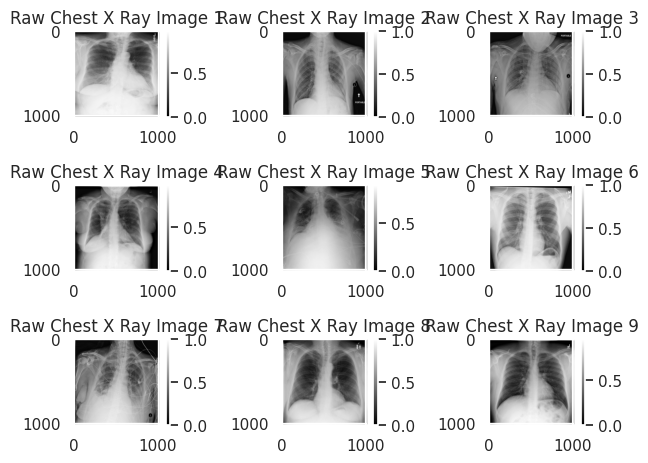

In [ ]:
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Plot the image
    plt.subplot(3, 3, i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.colorbar()
    plt.title(f'Raw Chest X Ray Image {i + 1}')

    # Print the statistical information for each image
    print(f"Image {i + 1} - {img_name}:")
    print(f"The dimensions of the image are {raw_image.shape[0]} pixels width and {raw_image.shape[1]} pixels height, one single color channel")
    print(f"The maximum pixel value is {raw_image.max():.4f} and the minimum is {raw_image.min():.4f}")
    print(f"The mean value of the pixels is {raw_image.mean():.4f} and the standard deviation is {raw_image.std():.4f}")
    print("-" * 50)

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


Seçilen görüntülerin histogramını çizdiriyoruz

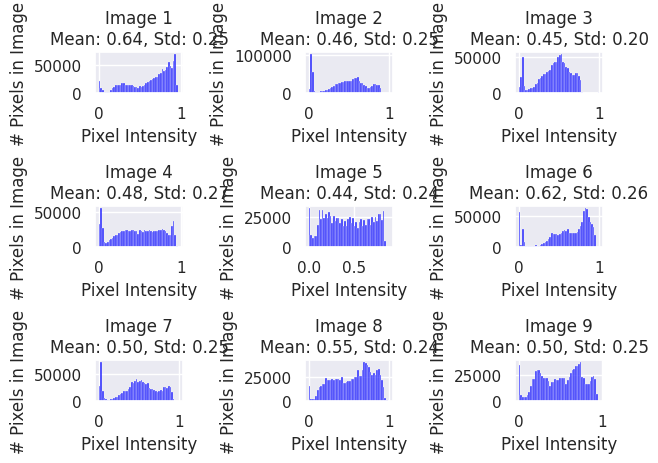

In [ ]:
# Görüntüleri döngüyle gez ve her birinin histogramını çiz
for i, img in enumerate(random_images):  # 'random_images' seçtiğiniz 9 görüntüyü içeren liste
    # Görüntüyü yükle
    raw_image = plt.imread(os.path.join(img_dir, img))

    # Subplot oluştur ve histogramı çiz
    plt.subplot(3, 3, i + 1)
    sns.histplot(raw_image.ravel(), kde=False, color='blue', bins=50)  # 50 binli histogram
    plt.title(f'Image {i+1}\nMean: {np.mean(raw_image):.2f}, Std: {np.std(raw_image):.2f}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('# Pixels in Image')

# Düzenleme yaparak görseli düzgün göster
plt.tight_layout()
plt.show()

numpy yüklüyoruz

In [ ]:
pip install numpy

9 GORUNTU ICIN CONTRAST STRECTCHING yapıyoruz ve GAMMA TRANSFORMATIONU uyguladık.

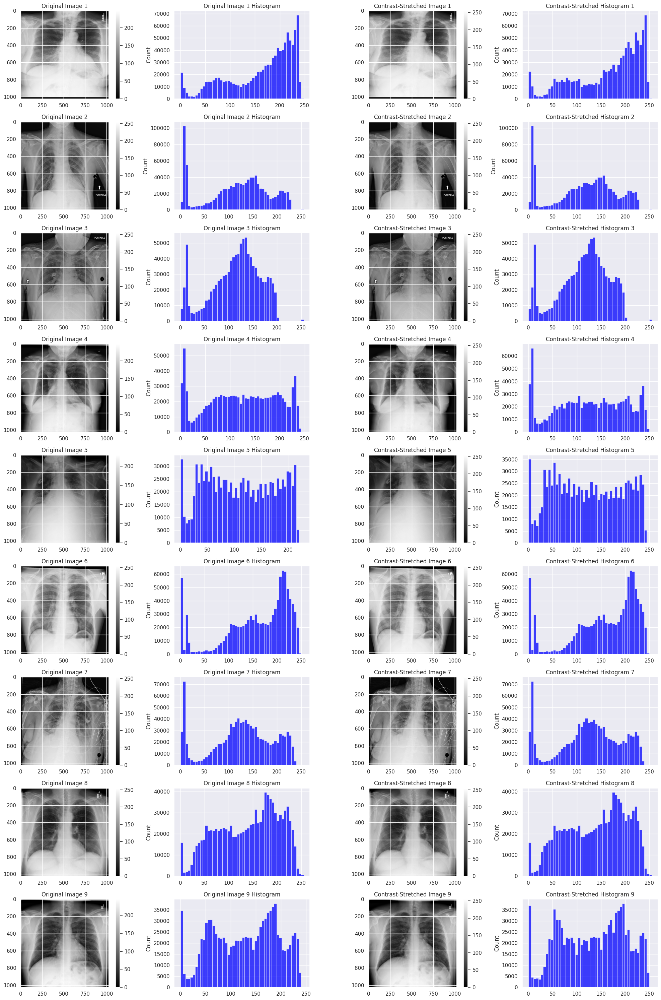

In [ ]:
# Increased figure size for better visualization with more subplots
plt.figure(figsize=(20, 30))

for i, img in enumerate(random_images):
    # Görüntüyü yükle
    raw_image = io.imread(os.path.join(img_dir, img))

    # Step 1: Contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 2: Apply histogram equalization after contrast stretching
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 3: Apply gamma correction on the equalized image
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot original image and its histogram
    plt.subplot(9, 4, 4*i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Original Image {i+1}')
    plt.colorbar()

    plt.subplot(9, 4, 4*i + 2) # Changed subplot index to 4*i + 2
    sns.histplot(raw_image.ravel(), kde=False, color='blue', bins=50)
    plt.title(f"Original Image {i+1} Histogram")

    # Plot contrast-stretched image and its histogram
    plt.subplot(9, 4, 4*i + 3) # Changed subplot index to 4*i + 3
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title(f'Contrast-Stretched Image {i+1}')
    plt.colorbar()

    plt.subplot(9, 4, 4*i + 4) # Changed subplot index to 4*i + 4
    sns.histplot(contrast_stretched.ravel(), kde=False, color='blue', bins=50)
    plt.title(f"Contrast-Stretched Histogram {i+1}")

# Düzenleme yaparak görseli düzgün göster
plt.tight_layout()
plt.show()

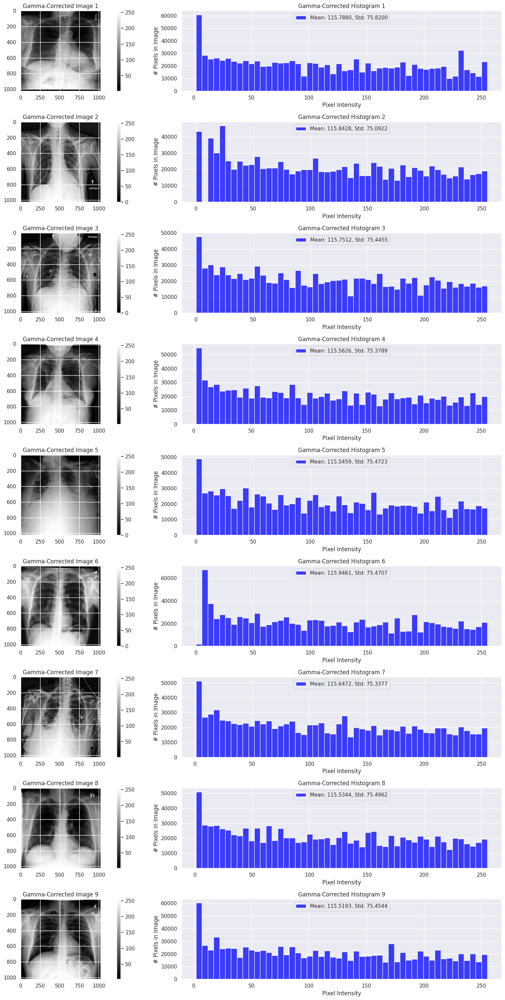

In [ ]:
# 9 görüntü için işlemleri yapacak döngü
plt.figure(figsize=(20, 30))  # Görsellerin daha iyi yerleşmesi için figür boyutunu artırdık

for i, img in enumerate(random_images):
    # Görüntüyü yükle
    raw_image = io.imread(os.path.join(img_dir, img))

    # Step 1: Contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 2: Apply histogram equalization after contrast stretching
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 3: Apply gamma correction on the equalized image
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot gamma-corrected image and its histogram
    plt.subplot(9, 2, 2*i + 1)  # Gamma-corrected image
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image {i+1}')
    plt.colorbar()

    # Plot histogram of gamma-corrected image
    plt.subplot(9, 2, 2*i + 2)  # Histogram of gamma-corrected image
    sns.histplot(gamma_corrected.ravel(), kde=False, color='blue', bins=50)
    plt.title(f"Gamma-Corrected Histogram {i+1}")
    plt.xlabel('Pixel Intensity')
    plt.ylabel('# Pixels in Image')

    # Display mean and standard deviation on the histogram plot
    mean_val = np.mean(gamma_corrected)
    std_val = np.std(gamma_corrected)
    plt.legend(loc='upper center', labels=[f'Mean: {mean_val:.4f}, Std: {std_val:.4f}'])

# Düzenleme yaparak görseli düzgün göster
plt.tight_layout()
plt.show()


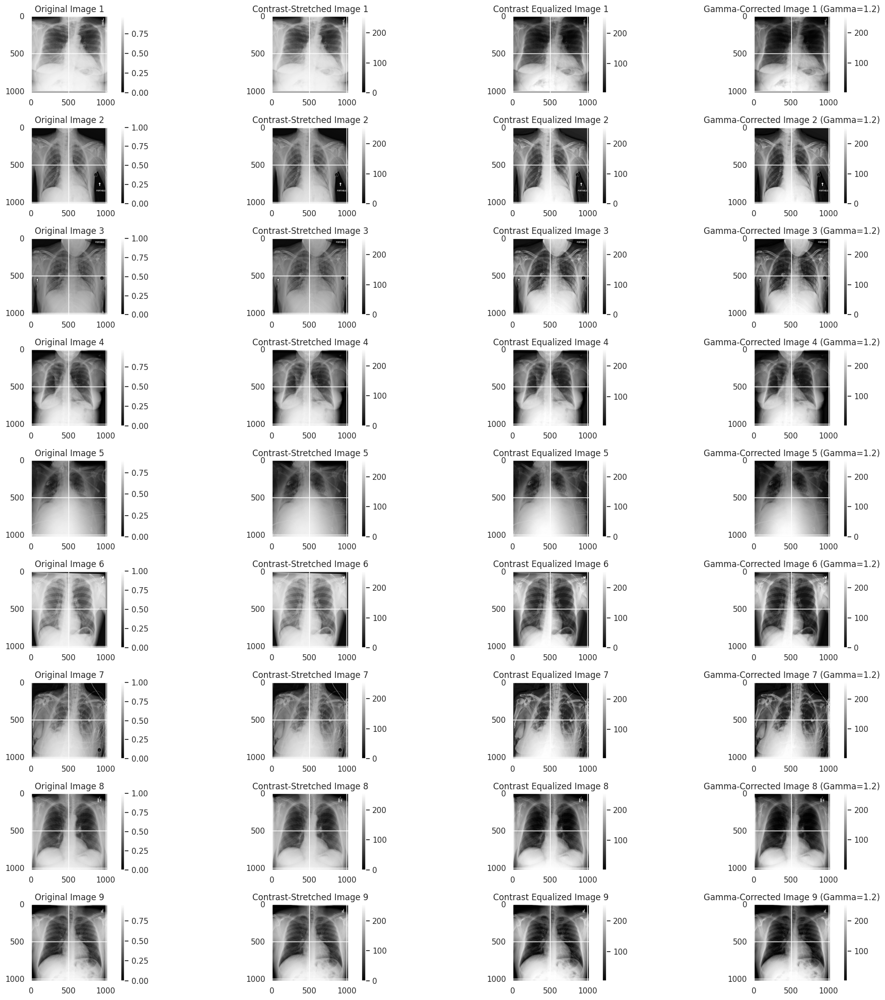

In [ ]:
import cv2

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply the filters
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Step 2: Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Step 3: Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot original image and histogram
    plt.subplot(9, 4, 4*i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.colorbar()

    # Plot contrast-stretched image and histogram
    plt.subplot(9, 4, 4*i + 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title(f'Contrast-Stretched Image {i + 1}')
    plt.colorbar()

    # Plot contrast-equalized image and histogram
    plt.subplot(9, 4, 4*i + 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title(f'Contrast Equalized Image {i + 1}')
    plt.colorbar()

    # Plot gamma-corrected image and histogram
    plt.subplot(9, 4, 4*i + 4)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image {i + 1} (Gamma={gamma})')
    plt.colorbar()

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


gamma_corrected görüntüsünün piksel yoğunluklarının dağılımını bir histogram olarak çiziyoruz.

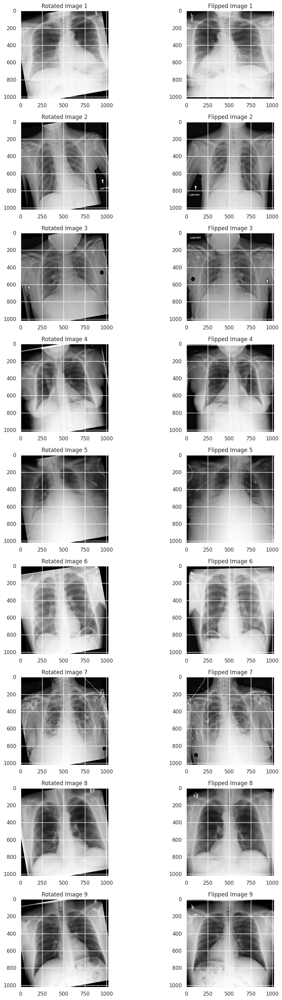

In [ ]:
# Görüntü işlemleri için figure boyutunu ayarlayın
plt.figure(figsize=(20, 30))

# 9 görsel üzerinde işlemleri yapmak için döngü
for i, img_file in enumerate(random_images):
    # Görüntüyü yükle
    img_path = os.path.join(img_dir, img_file)
    img = io.imread(img_path)

    # Median filtre uygulama (varsayalım, daha önce uygulandı)
    median_filtered = cv2.medianBlur(img, 5)

    # 10 derece döndürme işlemi
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

    # Yatay çevirme işlemi
    flipped_horizontal = cv2.flip(median_filtered, 1)

    # Sonuçları göster
    plt.subplot(9, 4, 4*i + 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
    plt.subplot(9, 4, 4*i + 2), plt.imshow(flipped_horizontal, cmap='gray'), plt.title(f"Flipped Image {i+1}")

# Görsel düzenlemeyi sıkıştır
plt.tight_layout()
plt.show()


TUM GORUNTULERE EMDIAN VE GAUSSIAN BLUR UYGULA

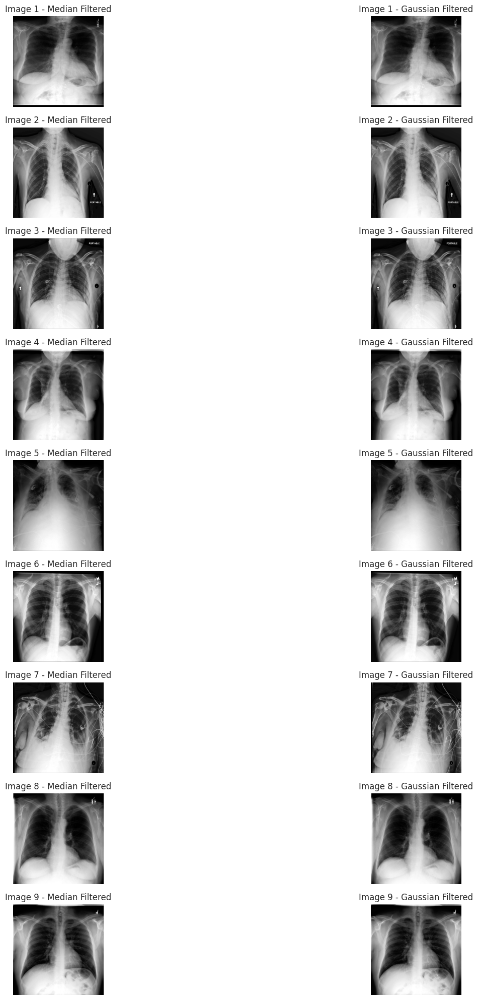

In [ ]:
import cv2

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply filters
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply gamma correction as done previously
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Apply Median Filtering
    median_filtered = cv2.medianBlur(gamma_corrected, 5)

    # Apply Gaussian Blur
    gaussian_filtered = cv2.GaussianBlur(gamma_corrected, (5, 5), 0)

    # Plot the results
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f"Image {i + 1} - Median Filtered")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title(f"Image {i + 1} - Gaussian Filtered")
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


DERECESI RASTGELE 0 ILA 10 ARASINDA OLACAK SEKILDE ROTATION UYGULAMA- GORUNTUYE FLIPPING UYGULAMA

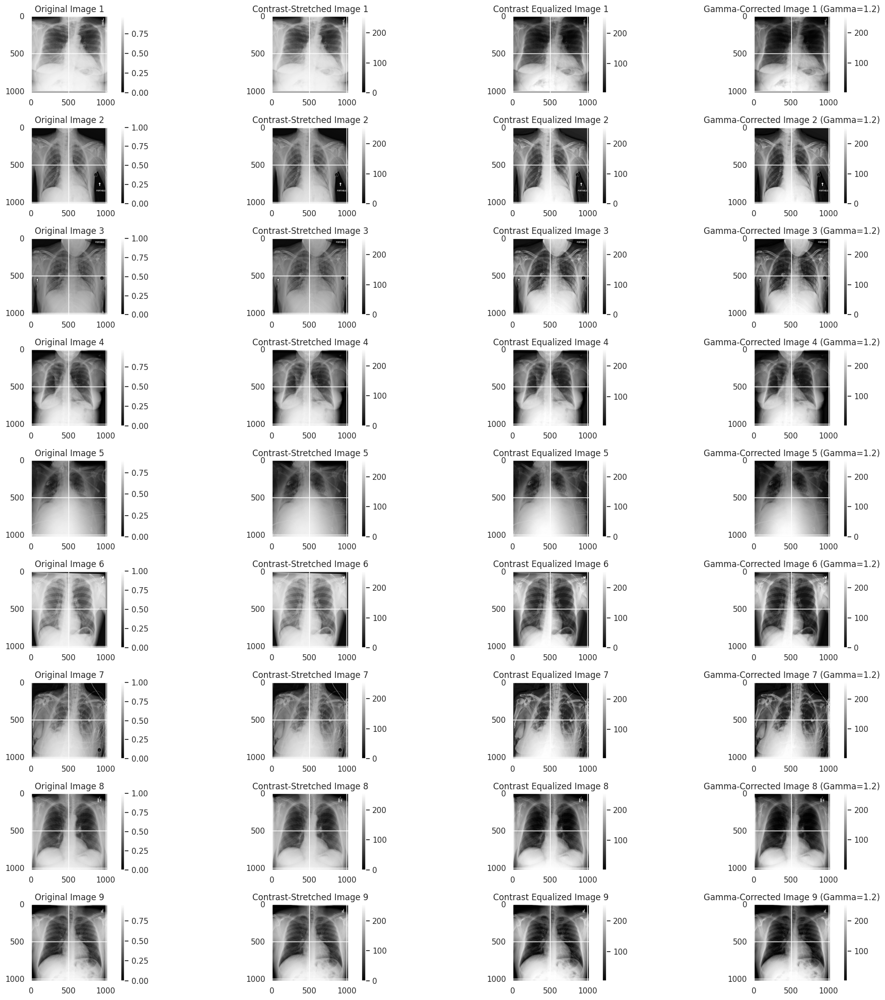

In [ ]:
import cv2

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply the filters
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Step 2: Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Step 3: Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot original image and histogram
    plt.subplot(9, 4, 4*i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.colorbar()

    # Plot contrast-stretched image and histogram
    plt.subplot(9, 4, 4*i + 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title(f'Contrast-Stretched Image {i + 1}')
    plt.colorbar()

    # Plot contrast-equalized image and histogram
    plt.subplot(9, 4, 4*i + 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title(f'Contrast Equalized Image {i + 1}')
    plt.colorbar()

    # Plot gamma-corrected image and histogram
    plt.subplot(9, 4, 4*i + 4)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image {i + 1} (Gamma={gamma})')
    plt.colorbar()

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


5. Döndürme ve Ayna Çevirme (Flipping).Rastgele Açılarla Döndürme

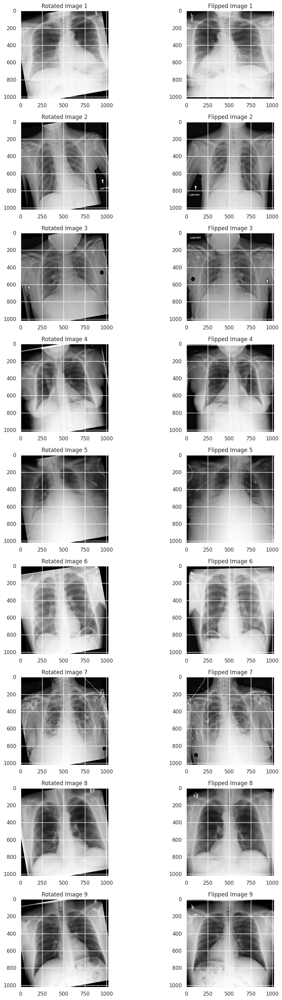

In [ ]:
# Görüntü işlemleri için figure boyutunu ayarlayın
plt.figure(figsize=(20, 30))

# 9 görsel üzerinde işlemleri yapmak için döngü
for i, img_file in enumerate(random_images):
    # Görüntüyü yükle
    img_path = os.path.join(img_dir, img_file)
    img = io.imread(img_path)

    # Median filtre uygulama (varsayalım, daha önce uygulandı)
    median_filtered = cv2.medianBlur(img, 5)

    # 10 derece döndürme işlemi
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

    # Yatay çevirme işlemi
    flipped_horizontal = cv2.flip(median_filtered, 1)

    # Sonuçları göster
    plt.subplot(9, 4, 4*i + 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
    plt.subplot(9, 4, 4*i + 2), plt.imshow(flipped_horizontal, cmap='gray'), plt.title(f"Flipped Image {i+1}")

# Görsel düzenlemeyi sıkıştır
plt.tight_layout()
plt.show()


##6.Frekans Alanında Filtreleme - Fourier Dönüşümü ve Filtreleme

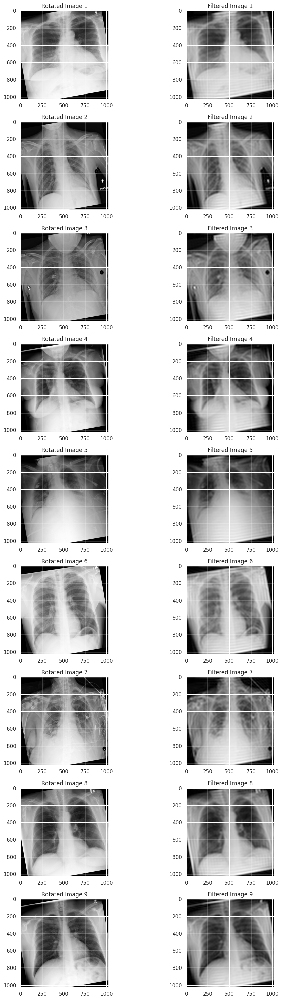

In [ ]:
# Görüntü işlemleri için figure boyutunu ayarlayın
plt.figure(figsize=(20, 30))

# 9 görsel üzerinde işlemleri yapmak için döngü
for i, img_file in enumerate(random_images):
    # Görüntüyü yükle
    img_path = os.path.join(img_dir, img_file)
    img = io.imread(img_path)

    # Median filtre uygulama (varsayalım, daha önce uygulandı)
    median_filtered = cv2.medianBlur(img, 5)

    # 10 derece döndürme işlemi
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

    # Fourier Dönüşümünü uygula ve düşük frekansları merkeze al
    dft = cv2.dft(np.float32(rotated_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)

    # Filtre maskesi oluştur
    rows, cols = rotated_image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1  # Merkezdeki düşük frekansları geçiren maske

    # Maskeyi uygula ve ters Fourier dönüşümünü yap
    fshift = dft_shifted * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])

    # Görüntüyü normalize et ve göster
    filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)

    # Sonuçları görselleştir
    plt.subplot(9, 4, 4*i + 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
    plt.subplot(9, 4, 4*i + 2), plt.imshow(filtered_image, cmap='gray'), plt.title(f"Filtered Image {i+1}")

# Görsel düzenlemeyi sıkıştır
plt.tight_layout()
plt.show()


##7.Keskinleştirme ve Enterpolasyon

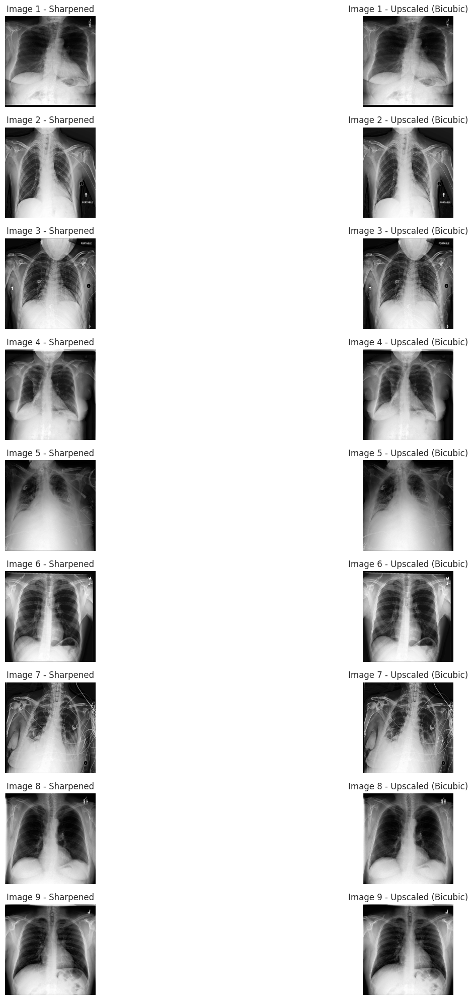

In [ ]:
from scipy.ndimage import zoom

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply sharpening and bicubic interpolation
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply gamma correction as done previously
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Step 4: Apply sharpening using an unsharp masking kernel
    sharpening_kernel = np.array([[-1, -1, -1],
                                  [-1,  9, -1],
                                  [-1, -1, -1]])
    sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, sharpening_kernel), 0, 255).astype(np.uint8)

    # Step 5: Apply bicubic interpolation to upscale the image by a factor of 2
    scale_factor = 2
    resized_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic interpolation with `order=3`

    # Plot the results
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(sharpened_image, cmap='gray')
    plt.title(f"Image {i + 1} - Sharpened")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(resized_image, cmap='gray')
    plt.title(f"Image {i + 1} - Upscaled (Bicubic)")
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()
